<a href="https://colab.research.google.com/github/ArtisticWenny/Data_Cleaning/blob/main/550_Diabetic_Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Packages

In [46]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import csv
from lightgbm import LGBMClassifier
import sys
import sklearn

from sklearn.model_selection import train_test_split, cross_validate

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler


import missingno as msno
import re

from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC
from sklearn.ensemble import GradientBoostingClassifier
import xgboost as xgb
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, classification_report, make_scorer
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, train_test_split
from scipy.stats import chi2_contingency, ttest_ind
import plotly.express as px


# Load in CSV

In [47]:
from google.colab import drive
drive.mount('/content/gdrive')

csv_file_path = '/content/gdrive/My Drive/diabetic_data.csv'

diabetic = pd.read_csv(csv_file_path)

print(diabetic.head)

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
<bound method NDFrame.head of         encounter_id  patient_nbr             race  gender      age weight  \
0            2278392      8222157        Caucasian  Female   [0-10)      ?   
1             149190     55629189        Caucasian  Female  [10-20)      ?   
2              64410     86047875  AfricanAmerican  Female  [20-30)      ?   
3             500364     82442376        Caucasian    Male  [30-40)      ?   
4              16680     42519267        Caucasian    Male  [40-50)      ?   
...              ...          ...              ...     ...      ...    ...   
101761     443847548    100162476  AfricanAmerican    Male  [70-80)      ?   
101762     443847782     74694222  AfricanAmerican  Female  [80-90)      ?   
101763     443854148     41088789        Caucasian    Male  [70-80)      ?   
101764     443857166     31693671        Caucasian  Female 

# About This Dataset

According to UC Irvine, thie dataset is a representation of clinical care for 130 hospitals in the United States over the span of 10 years (1999 to 2008). The purpose of the data is to detect the possibility of patient readmission within 30 days of discharge.

# Inspect the shape

In [48]:
print("Number of rows:", diabetic.shape[0])
print("Number of columns:", diabetic.shape[1])

Number of rows: 101766
Number of columns: 50


# Visualization of readmissions


In [49]:
y = diabetic['readmitted']
print(f'Percentage of patients readmitted after 30 days: % {round(y.value_counts(normalize=True)[1]*100,2)} --> ({y.value_counts()[1]} patient)\nPercentage of patients not readmitted: % {round(y.value_counts(normalize=True)[0]*100,2)} --> ({y.value_counts()[0]} patient)\nPercentage of patients readmitted under 30 days: % {round(y.value_counts(normalize=True)[2]*100,2)} --> ({y.value_counts()[2]} patient)')

Percentage of patients readmitted after 30 days: % 34.93 --> (35545 patient)
Percentage of patients not readmitted: % 53.91 --> (54864 patient)
Percentage of patients readmitted under 30 days: % 11.16 --> (11357 patient)


In [50]:
fig = px.histogram(diabetic, x="readmitted", title='readmitted', width=400, height=400)
fig.show()

It is inferred from this visualization that,
*   34.93% of patients are re-admitted after 30 days, 35,545 patients.
*   53.91% of patients are not admitted, 54,864 patients.
*   11.16% of patients are re-admitted before 30 days, 11,357 patients.

In [51]:
diabetic.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 50 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   encounter_id              101766 non-null  int64 
 1   patient_nbr               101766 non-null  int64 
 2   race                      101766 non-null  object
 3   gender                    101766 non-null  object
 4   age                       101766 non-null  object
 5   weight                    101766 non-null  object
 6   admission_type_id         101766 non-null  int64 
 7   discharge_disposition_id  101766 non-null  int64 
 8   admission_source_id       101766 non-null  int64 
 9   time_in_hospital          101766 non-null  int64 
 10  payer_code                101766 non-null  object
 11  medical_specialty         101766 non-null  object
 12  num_lab_procedures        101766 non-null  int64 
 13  num_procedures            101766 non-null  int64 
 14  num_

<Axes: >

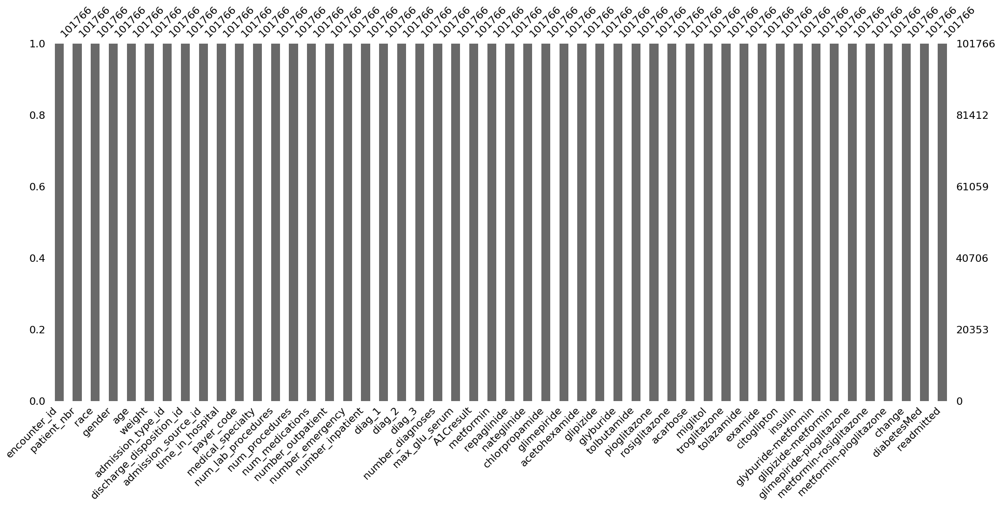

In [52]:
msno.bar(diabetic)

# Replacing '?' with '0'

In [53]:
modified_weight = diabetic.replace('?', '0')
print(modified_weight)

        encounter_id  patient_nbr             race  gender      age weight  \
0            2278392      8222157        Caucasian  Female   [0-10)      0   
1             149190     55629189        Caucasian  Female  [10-20)      0   
2              64410     86047875  AfricanAmerican  Female  [20-30)      0   
3             500364     82442376        Caucasian    Male  [30-40)      0   
4              16680     42519267        Caucasian    Male  [40-50)      0   
...              ...          ...              ...     ...      ...    ...   
101761     443847548    100162476  AfricanAmerican    Male  [70-80)      0   
101762     443847782     74694222  AfricanAmerican  Female  [80-90)      0   
101763     443854148     41088789        Caucasian    Male  [70-80)      0   
101764     443857166     31693671        Caucasian  Female  [80-90)      0   
101765     443867222    175429310        Caucasian    Male  [70-80)      0   

        admission_type_id  discharge_disposition_id  admission_

# Checking for duplicates

In [54]:
diabetic.duplicated().sum()


0

# Drop Unnecessary Columns

In [55]:
diabetic.drop(['patient_nbr', 'encounter_id', 'diag_1', 'diag_2', 'diag_3', 'payer_code', 'admission_type_id', 'discharge_disposition_id', 'admission_source_id' ], axis = 1, inplace = True)
diabetic.head()

,race,gender,age,weight,time_in_hospital,medical_specialty,num_lab_procedures,num_procedures,num_medications,number_outpatient,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,Caucasian,Female,[0-10),?,1,Pediatrics-Endocrinology,41,0,1,0,...,No,No,No,No,No,No,No,No,No,NO
1,Caucasian,Female,[10-20),?,3,?,59,0,18,0,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,AfricanAmerican,Female,[20-30),?,2,?,11,5,13,2,...,No,No,No,No,No,No,No,No,Yes,NO
3,Caucasian,Male,[30-40),?,2,?,44,1,16,0,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,Caucasian,Male,[40-50),?,1,?,51,0,8,0,...,No,Steady,No,No,No,No,No,Ch,Yes,NO


# Finding any missing values

In [56]:
missing_count = diabetic.isnull().sum()
print("Total missing values in each column:")
print(missing_count)

Total missing values in each column:
race                        0
gender                      0
age                         0
weight                      0
time_in_hospital            0
medical_specialty           0
num_lab_procedures          0
num_procedures              0
num_medications             0
number_outpatient           0
number_emergency            0
number_inpatient            0
number_diagnoses            0
max_glu_serum               0
A1Cresult                   0
metformin                   0
repaglinide                 0
nateglinide                 0
chlorpropamide              0
glimepiride                 0
acetohexamide               0
glipizide                   0
glyburide                   0
tolbutamide                 0
pioglitazone                0
rosiglitazone               0
acarbose                    0
miglitol                    0
troglitazone                0
tolazamide                  0
examide                     0
citoglipton                 0
ins

In [57]:
missing_values = diabetic.isnull().any()
if missing_values.any():
    print("Missing values detected in columns:", missing_values[missing_values].index.tolist())
else:
    print("No missing values.")

No missing values.


# Exploratory Data Analysis

In [58]:
categorical = ['readmitted', 'gender', 'race', 'diabetesMed', 'age']

numerical = ['weight', 'num_lab_procedures', 'num_procedures', 'num_medications', 'number_outpatient', 'number_emergency', 'number_inpatient', 'number_diagnoses', 'time_in_hospital']

In [59]:
diabetic[numerical].describe()

,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,time_in_hospital
count,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000
mean,43.095641,1.339730,16.021844,0.369357,0.197836,0.635566,7.422607,4.395987
std,19.674362,1.705807,8.127566,1.267265,0.930472,1.262863,1.933600,2.985108
min,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000
25%,31.000000,0.000000,10.000000,0.000000,0.000000,0.000000,6.000000,2.000000
50%,44.000000,1.000000,15.000000,0.000000,0.000000,0.000000,8.000000,4.000000
75%,57.000000,2.000000,20.000000,0.000000,0.000000,1.000000,9.000000,6.000000
max,132.000000,6.000000,81.000000,42.000000,76.000000,21.000000,16.000000,14.000000


## Skew

In [60]:
diabetic[numerical].skew()

<ipython-input-60-984a2da03093>:1: FutureWarning:

The default value of numeric_only in DataFrame.skew is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.



num_lab_procedures    -0.236544
num_procedures         1.316415
num_medications        1.326672
number_outpatient      8.832959
number_emergency      22.855582
number_inpatient       3.614139
number_diagnoses      -0.876746
time_in_hospital       1.133999
dtype: float64

### In these results
* num_lab_procedures has a left skew
* num_procedures has a right skew
* num_medications has a right skew   
* number_outpatient has a right skew
* number_emergency has a right skew
* number_inpatient has a right skew
* number_diagnoses has a left skew
* time_in_hospital has a right skew


### Univariate Analysis

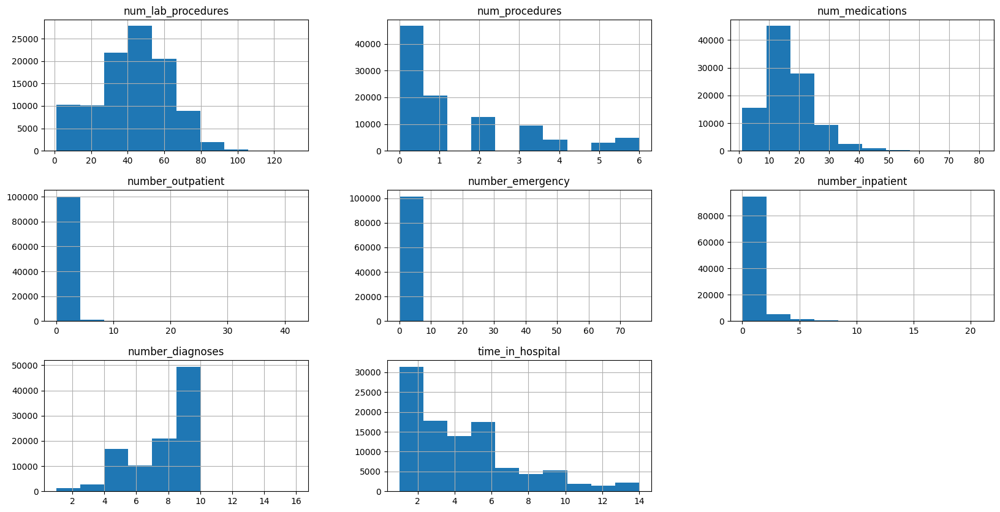

In [61]:
diabetic[numerical].hist(figsize=(20,10));

### Categorical Feautres
* Gender
* Race
* diabetesMed
* readmitted



In [62]:
print (f'{round(diabetic["gender"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(diabetic, x="gender", title='Gender', width=500, height=500)
fig.show()

Female             53.76
Male               46.24
Unknown/Invalid     0.00
Name: gender, dtype: float64


In this dataset there are 54,708 females and 47,055 males

In [63]:
print (f'{round(diabetic["race"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(diabetic, x="race", title='Race', width=500, height=500)
fig.show()

Caucasian          74.78
AfricanAmerican    18.88
?                   2.23
Hispanic            2.00
Other               1.48
Asian               0.63
Name: race, dtype: float64


In [64]:
print (f'{round(diabetic["age"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(diabetic, x="age", title='age', width=500, height=500)
fig.show()

[70-80)     25.62
[60-70)     22.09
[50-60)     16.96
[80-90)     16.90
[40-50)      9.52
[30-40)      3.71
[90-100)     2.74
[20-30)      1.63
[10-20)      0.68
[0-10)       0.16
Name: age, dtype: float64


In [65]:
print (f'{round(diabetic["diabetesMed"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(diabetic, x="diabetesMed", title='Diabetes Medication', width=500, height=500)
fig.show()

Yes    77.0
No     23.0
Name: diabetesMed, dtype: float64


78,363 participants are taking diabetes medication and 23,403 are not taking diabetes medication

In [66]:
print (f'{round(diabetic["readmitted"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(diabetic, x="readmitted", title='Readmissions', width=500, height=500)
fig.show()

NO     53.91
>30    34.93
<30    11.16
Name: readmitted, dtype: float64


# Bivariate only on <30 on Gender

In [67]:
Readmissions = diabetic[['gender','readmitted']]
print(Readmissions)
Revised_Readmissions = Readmissions[Readmissions['readmitted'] == '<30']
print(Revised_Readmissions)


        gender readmitted
0       Female         NO
1       Female        >30
2       Female         NO
3         Male         NO
4         Male         NO
...        ...        ...
101761    Male        >30
101762  Female         NO
101763    Male         NO
101764  Female         NO
101765    Male         NO

[101766 rows x 2 columns]
        gender readmitted
11        Male        <30
12      Female        <30
16        Male        <30
46      Female        <30
50        Male        <30
...        ...        ...
101699  Female        <30
101727  Female        <30
101732  Female        <30
101746    Male        <30
101750  Female        <30

[11357 rows x 2 columns]


In [68]:
fig = px.histogram(Revised_Readmissions, x="gender", color="readmitted",width=600, height=400)
fig.show()

* 5205 Males were readmitted under 30 days
* 6152 Females were readmitted under 30 days

# Bivariate Analysis

In [69]:
fig = px.histogram(diabetic, x="gender", color="readmitted",width=600, height=400)
fig.show()

* More females are readmitted than males
* More females are readmitted after 30 days than males
* More females are readmitted before 30 days
* More females have no readmissions than males

In [70]:
fig = px.histogram(diabetic, x="age", color="readmitted",width=600, height=400)
fig.show()

70-80 year olds were readmitted more often

In [71]:
fig = px.histogram(diabetic, x="race", color="readmitted",width=600, height=400)
fig.show()

Caucasians are readmitted more often

In [72]:
fig = px.histogram(diabetic, x="diabetesMed", color="readmitted",width=600, height=400)
fig.show()

# Metrics of Importance

In [73]:
from sklearn.metrics import mutual_info_score
def cat_mut_inf(series):
    return mutual_info_score(series, diabetic['readmitted'])
    diabetic_cat = diabetic[categorical].apply(cat_mut_inf)
    diabetic_cat = diabetic_cat.sort_values(ascending=False).to_frame(name='mutual_info_score')
    diabetic_cat

# Correlation Matrix & Scatter Plots

In [74]:
diabetic[numerical].corr()

<ipython-input-74-3fa6b086643a>:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,time_in_hospital
num_lab_procedures,1.000000,0.058066,0.268161,-0.007602,-0.002279,0.039231,0.152773,0.318450
num_procedures,0.058066,1.000000,0.385767,-0.024819,-0.038179,-0.066236,0.073734,0.191472
num_medications,0.268161,0.385767,1.000000,0.045197,0.013180,0.064194,0.261526,0.466135
number_outpatient,-0.007602,-0.024819,0.045197,1.000000,0.091459,0.107338,0.094152,-0.008916
number_emergency,-0.002279,-0.038179,0.013180,0.091459,1.000000,0.266559,0.055539,-0.009681
number_inpatient,0.039231,-0.066236,0.064194,0.107338,0.266559,1.000000,0.104710,0.073623
number_diagnoses,0.152773,0.073734,0.261526,0.094152,0.055539,0.104710,1.000000,0.220186
time_in_hospital,0.318450,0.191472,0.466135,-0.008916,-0.009681,0.073623,0.220186,1.000000


There isn't much of a positive correlation

In [75]:
diabetic.groupby('readmitted')[numerical].mean()

<ipython-input-75-f9c0e7693b89>:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,time_in_hospital
readmitted,,,,,,,,
<30,44.226028,1.280884,16.903143,0.436911,0.357313,1.224003,7.692789,4.768249
>30,43.836601,1.249599,16.282768,0.496329,0.283669,0.838993,7.646898,4.495541
NO,42.381598,1.410305,15.670367,0.273112,0.109216,0.381963,7.221366,4.254429


There is a strong correlation with num_lab_procedures, num_medications and number_diagnoses

In [76]:
fig = px.scatter(diabetic, x="readmitted", y="num_lab_procedures", title="Time in Hospital & Readmission", color="readmitted", hover_data=diabetic[['readmitted']])
fig.show()

# Linear Regression


#### Converting Categroical Features into Numeric Features

In [77]:
diabetic = pd.get_dummies(diabetic, drop_first = False)

# Breaking the data up into Train & Test

In [78]:
train_df, valid_df, test_df = np.split(diabetic.sample(frac=1, random_state=42),
                                       [int(.7*len(diabetic)), int(0.85*len(diabetic))])
train_df = train_df.reset_index(drop = True)
valid_df = valid_df.reset_index(drop = True)
test_df = test_df.reset_index(drop = True)

In [79]:
print(train_df.columns)

Index(['time_in_hospital', 'num_lab_procedures', 'num_procedures',
       'num_medications', 'number_outpatient', 'number_emergency',
       'number_inpatient', 'number_diagnoses', 'race_?',
       'race_AfricanAmerican',
       ...
       'metformin-rosiglitazone_Steady', 'metformin-pioglitazone_No',
       'metformin-pioglitazone_Steady', 'change_Ch', 'change_No',
       'diabetesMed_No', 'diabetesMed_Yes', 'readmitted_<30', 'readmitted_>30',
       'readmitted_NO'],
      dtype='object', length=196)


In [80]:
readmitted_count = ('readmitted_<30', 'readmitted_>30', 'readmitted_NO')

In [84]:
diabetic['readmitted_<30'].value_counts()

0    90409
1    11357
Name: readmitted_<30, dtype: int64

In [85]:
train_df['readmitted_<30'].value_counts()

0    63275
1     7961
Name: readmitted_<30, dtype: int64

In [86]:
valid_df['readmitted_<30'].value_counts()

0    13520
1     1745
Name: readmitted_<30, dtype: int64

In [87]:
test_df['readmitted_<30'].value_counts()

0    13614
1     1651
Name: readmitted_<30, dtype: int64

In [88]:
def calc_prevalence(y_actual):

    '''
    This function is to understand the ratio/distribution of the classes that we are going to predict for.

    Params:
    1. y_actual: The target feature

    Return:
    1. (sum(y_actual)/len(y_actual)): The ratio of the postive class in the comlpete data.
    '''

    return (sum(y_actual)/len(y_actual))

In [90]:
rows_pos = train_df['readmitted_<30'] == 1
df_train_pos = train_df.loc[rows_pos]
df_train_neg = train_df.loc[~rows_pos]

# merge the balanced data
diabetic_df_balanced = pd.concat([df_train_pos, df_train_neg.sample(n = len(df_train_pos), random_state = 111)],axis = 0)

# shuffle the order of training samples
diabetic_df_balanced = diabetic_df_balanced.sample(n = len(diabetic_df_balanced), random_state = 42).reset_index(drop = True)

print('Train balanced prevalence(n = %d):%.3f'%(len(diabetic_df_balanced), \
                                                calc_prevalence(diabetic_df_balanced['readmitted_<30'].values)))

Train balanced prevalence(n = 15922):0.500


In [91]:
diabetic_df_balanced['readmitted_<30'].value_counts()

1    7961
0    7961
Name: readmitted_<30, dtype: int64

In [92]:
X_train = diabetic_df_balanced.drop('readmitted_<30',axis=1)

y_train = diabetic_df_balanced['readmitted_<30']

X_valid = valid_df.drop('readmitted_<30',axis=1)

y_valid = valid_df['readmitted_<30']

X_test = test_df.drop('readmitted_<30',axis=1)

y_test = test_df['readmitted_<30']

In [93]:
scaler=StandardScaler()
X_train[['number_emergency', 'num_medications', 'number_diagnoses']] = pd.DataFrame(scaler.fit_transform(X_train[['number_emergency', 'num_medications', 'number_diagnoses']]),columns=['number_emergency', 'num_medications', 'number_diagnoses'])
X_valid[['number_emergency', 'num_medications', 'number_diagnoses']] = pd.DataFrame(scaler.transform(X_valid[['number_emergency', 'num_medications', 'number_diagnoses']]),columns=['number_emergency', 'num_medications', 'number_diagnoses'])
X_test[['number_emergency', 'num_medications', 'number_diagnoses']] = pd.DataFrame(scaler.transform(X_test[['number_emergency', 'num_medications', 'number_diagnoses']]),columns=['number_emergency', 'num_medications', 'number_diagnoses'])

# Creating Models

In [94]:
def calc_specificity(y_actual, y_pred, thresh):
    return sum((y_pred < thresh) & (y_actual == 0)) / sum(y_actual == 0)

def print_report(y_actual, y_pred, thresh=0.5):
    auc = roc_auc_score(y_actual, y_pred)
    accuracy = accuracy_score(y_actual, (y_pred > thresh))
    recall = recall_score(y_actual, (y_pred > thresh))
    precision = precision_score(y_actual, (y_pred > thresh))
    specificity = calc_specificity(y_actual, y_pred, thresh)
    print('AUC:%.3f' % auc)
    print('accuracy:%.3f' % accuracy)
    print('recall:%.3f' % recall)
    print('precision:%.3f' % precision)
    print('specificity:%.3f' % specificity)
    print('prevalence:%.3f' % calc_prevalence(y_actual))
    print(' ')

    return auc, accuracy, recall, precision, specificity

# Linear Regression

In [95]:
lnr = LinearRegression()
lnr.fit(X_train, y_train)


y_valid_preds = lnr.predict(X_valid)

In [96]:
y_valid_preds

array([ 4.44089210e-16,  4.44089210e-16,  1.55431223e-15, ...,
       -1.55431223e-15,  1.55431223e-15, -4.44089210e-16])

# Logistic Regression



In [97]:
lr=LogisticRegression(random_state = 42, solver = 'newton-cg', max_iter = 200)
lr.fit(X_train, y_train)

y_valid_preds = lr.predict_proba(X_valid)[:,1]

print('Metrics for Validation data:')

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,y_valid_preds, 0.5)

Metrics for Validation data:
AUC:1.000
accuracy:1.000
recall:1.000
precision:1.000
specificity:1.000
prevalence:0.114
 


In [98]:
lr=LogisticRegression(random_state = 42, solver = 'newton-cg', max_iter = 200)
lr.fit(X_train, y_train)

y_valid_preds = lr.predict_proba(X_valid)[:,1]

print('Metrics for Validation data:')

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,y_valid_preds, 0.5)

Metrics for Validation data:
AUC:1.000
accuracy:1.000
recall:1.000
precision:1.000
specificity:1.000
prevalence:0.114
 


In [99]:
print(y_train)

0        1
1        1
2        1
3        0
4        0
        ..
15917    0
15918    1
15919    1
15920    0
15921    1
Name: readmitted_<30, Length: 15922, dtype: uint8


In [100]:
knn = KNeighborsClassifier(n_neighbors = 100)
knn.fit(X_train, y_train)

knn_preds = knn.predict_proba(X_valid)[:,1]

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,knn_preds, 0.5)

AUC:0.790
accuracy:0.675
recall:0.759
precision:0.226
specificity:0.626
prevalence:0.114
 


In [101]:
sgdc=SGDClassifier(loss = 'log_loss',alpha = 0.1,random_state = 42)
sgdc.fit(X_train, y_train)

sgd_preds = sgdc.predict_proba(X_valid)[:,1]

print('Stochastic Gradient Descent')
print('Validation:')
sgdc_valid_auc, sgdc_valid_accuracy, sgdc_valid_recall, \
                sgdc_valid_precision, sgdc_valid_specificity = print_report(y_valid,sgd_preds, 0.5)

Stochastic Gradient Descent
Validation:
AUC:0.987
accuracy:0.957
recall:0.991
precision:0.729
specificity:0.952
prevalence:0.114
 


# Decision Tree

In [102]:
dc_clf = DecisionTreeClassifier(random_state=42, max_depth = 10)
dc_clf.fit(X_train, y_train)

dc_preds_proba = dc_clf.predict_proba(X_valid)[:,1]
dc_preds = dc_clf.predict(X_valid)

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,dc_preds_proba, 0.5)

AUC:1.000
accuracy:1.000
recall:1.000
precision:1.000
specificity:1.000
prevalence:0.114
 


In [103]:
recall_score(y_valid, dc_hp_preds)

NameError: name 'dc_hp_preds' is not defined

# Random Forest - Hyper Parameter Tuning

In [104]:
rf_grid = {'n_estimators':range(200,1000,200), # number of trees
           'max_features':['auto','sqrt'], # maximum number of features to use at each split
           'max_depth':range(1,11,1), # maximum depth of the tree
           'min_samples_split':range(2,10,2), # minimum number of samples to split a node
           'criterion':['gini','entropy']} # criterion for evaluating a split

rf_random = RandomizedSearchCV(estimator = rf_clf, param_distributions = rf_grid,
                               n_iter = 20, cv = 2, scoring=recall_scoring,
                               verbose = 1, random_state = 111)

rf_random.fit(X_train, y_train)

rf_random.best_params_

rf_hp_preds = rf_random.best_estimator_.predict(X_valid)
rf_hp_preds_proba = rf_random.best_estimator_.predict_proba(X_valid)[:,1]
roc_auc_score(y_valid, rf_hp_preds_proba)

NameError: name 'rf_clf' is not defined

In [ ]:
recall_score(y_valid, rf_hp_preds)

# XGBoost - Hyper Parameter Tuning

In [ ]:
xgb_grid = params = {
        'min_child_weight': [1, 5, 8, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 0.9, 1.0],
        'max_depth': [3, 4, 5]
        } # criterion for evaluating a split

xgb_random = GridSearchCV(estimator = xgb_clf, param_grid = xgb_grid,
                               cv = 2, scoring = recall_scoring,
                               verbose = 1)

xgb_random.fit(X_train, y_train)

xgb_random.best_params_

xgb_hp_preds = xgb_random.best_estimator_.predict(X_valid)
xgb_hp_preds_proba = xgb_random.best_estimator_.predict_proba(X_valid)[:,1]
roc_auc_score(y_valid, xgb_hp_preds_proba)

In [ ]:
recall_score(y_valid, xgb_hp_preds)